In [1]:
# Helper libraries
import datetime
from packaging import version
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestClassifier

from collections import Counter
import numpy as np
import pandas as pd

# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow import keras
from tensorflow.keras import models
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.datasets import mnist
#from plot_keras_history import plot_history

In [2]:
%matplotlib inline
# These options determine the way floating point numbers, arrays and other NumPy objects are displayed.
# See https://numpy.org/doc/stable/reference/generated/numpy.set_printoptions.html
np.set_printoptions(precision=3, suppress=True) 

EXPERIMENT 1

In [2]:
(x_train, y_train), (x_test, y_test)= tf.keras.datasets.mnist.load_data()

In [3]:
y_train_encoded = to_categorical(y_train)
y_test_encoded = to_categorical(y_test)

In [4]:
x_train = np.reshape(x_train, (60000, 784))
x_test = np.reshape(x_test, (10000, 784))

In [5]:
x_train = x_train.astype('float32') / 255
x_test = x_test.astype('float32') / 255

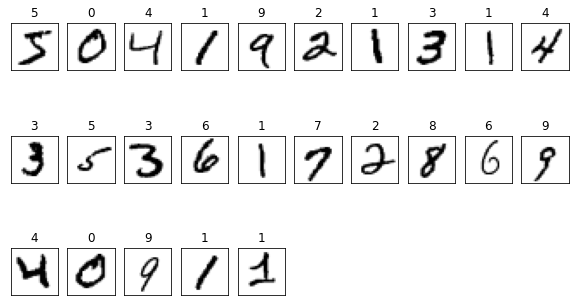

In [26]:
fig = plt.figure (figsize= (10,10))
for i in range(25):
    plt.subplot(5,10, 1+i)
    plt.title(y_train[i])
    plt.xticks([])
    plt.yticks([])
    plt.imshow(x_train[i].reshape(28,28), cmap='binary')

In [29]:
print('labels for first 10:', y_train[:10])

labels for first 10: [5 0 4 1 9 2 1 3 1 4]


In [7]:
model = Sequential([
    Dense(input_shape=[784], units = 1, activation = tf.nn.relu),
    Dense(name = "output_layer", units = 10, activation = tf.nn.softmax)
]) #0.08333

In [8]:
model.compile(optimizer='rmsprop',           
               loss = 'categorical_crossentropy',
               metrics=['accuracy'])

In [9]:
history = model.fit(
    x_train
    ,y_train_encoded
    ,epochs = 200
    ,validation_split=0.08333
    ,callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10)] 
    )

Epoch 1/200
1719/1719 [==============================] - 4s 2ms/step - loss: 2.0436 - accuracy: 0.1982 - val_loss: 1.8116 - val_accuracy: 0.2786
Epoch 2/200
1719/1719 [==============================] - 2s 1ms/step - loss: 1.8020 - accuracy: 0.2636 - val_loss: 1.7205 - val_accuracy: 0.2944
Epoch 3/200
1719/1719 [==============================] - 2s 1ms/step - loss: 1.7314 - accuracy: 0.2814 - val_loss: 1.6869 - val_accuracy: 0.3120
Epoch 4/200
1719/1719 [==============================] - 2s 1ms/step - loss: 1.7072 - accuracy: 0.3091 - val_loss: 1.6660 - val_accuracy: 0.3258
Epoch 5/200
1719/1719 [==============================] - 2s 1ms/step - loss: 1.6931 - accuracy: 0.3173 - val_loss: 1.6551 - val_accuracy: 0.3228
Epoch 6/200
1719/1719 [==============================] - 2s 916us/step - loss: 1.6783 - accuracy: 0.3199 - val_loss: 1.6423 - val_accuracy: 0.3246
Epoch 7/200
1719/1719 [==============================] - 2s 982us/step - loss: 1.6752 - accuracy: 0.3247 - val_loss: 1.6384 - va

In [130]:
layer_outputs = [layer.output for layer in model.layers]

activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [131]:
activations = activation_model.predict(x_train)
hidden_layer_activation = activations[0]
output_layer_activations = activations[1]
hidden_layer_activation.shape

(60000, 1)

In [132]:
activation_data = {'actual_class':y_train}
for k in range(0,1): 
    activation_data[f"act_val_{k}"] = hidden_layer_activation[:,k]

activation_df = pd.DataFrame(activation_data)
activation_df

,actual_class,act_val_0
0,5,3.202776
1,0,1.197328
2,4,0.685927
3,1,5.829427
4,9,0.000000
...,...,...
59995,8,3.294115
59996,3,4.029860
59997,5,1.212710
59998,6,1.188030


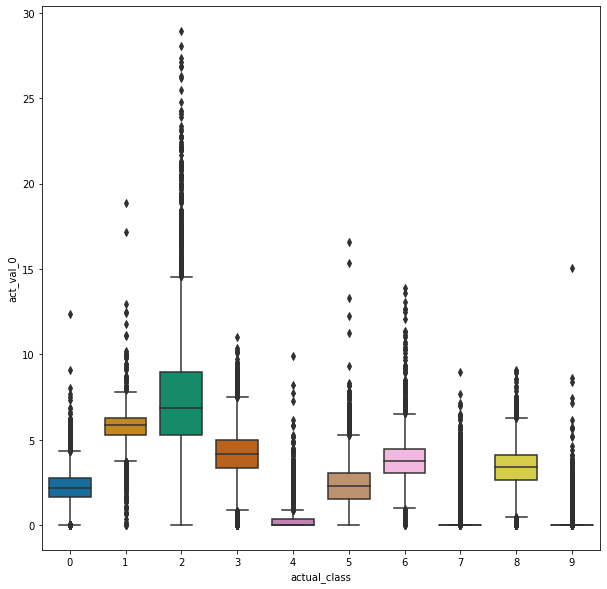

In [135]:
fig, ax = pyplot.subplots(figsize=(10, 10))
bplot = sns.boxplot(y='act_val_0', x='actual_class', 
                 data=activation_df[['act_val_0','actual_class']], 
                 width=0.75,
                 palette="colorblind")

In [14]:
pred_classes = np.argmax(model.predict(x_test), axis=-1)
pred_classes

array([9, 2, 1, ..., 9, 0, 6], dtype=int64)

In [15]:
conf_mx = tf.math.confusion_matrix(y_test, pred_classes)
conf_mx

<tf.Tensor: shape=(10, 10), dtype=int32, numpy=
array([[664,   6,   0,  18,   0,   0,  93,  62, 104,  33],
       [  4, 961,  72,  78,   0,   0,  18,   0,   2,   0],
       [ 35, 294, 563,  71,   0,   0,  43,   5,  17,   4],
       [106, 298,  43, 226,   0,   0, 242,  15,  64,  16],
       [100,   1,   0,   1,   0,   0,  16, 163,   4, 697],
       [454,  40,   6,  44,   0,   0, 127,  79,  89,  53],
       [176, 158,  11, 212,   0,   0, 298,   7,  94,   2],
       [ 95,  13,   1,  14,   0,   0,  17, 103,   9, 776],
       [294,  72,   5, 127,   0,   0, 324,  23, 122,   7],
       [ 68,   2,   0,   2,   0,   0,   5, 121,   6, 805]])>

In [16]:
from sklearn.metrics import accuracy_score
print(f'accuracy score for 1 node hidden layer is: {accuracy_score(y_test, pred_classes)*100}%')

accuracy score for 1 node hidden layer is: 37.419999999999995%


EXPERIMENT 2

In [17]:
model2 = Sequential([
    Dense(input_shape=[784], units = 2, activation = tf.nn.relu),
    Dense(name = "output_layer", units = 10, activation = tf.nn.softmax)
])
model2.compile(optimizer='rmsprop',           
               loss = 'categorical_crossentropy',
               metrics=['accuracy'])

In [18]:
history = model2.fit(
    x_train
    ,y_train_encoded
    ,epochs = 200
    ,validation_split=0.08333
    ,callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10)] 
    )

Epoch 1/200
1719/1719 [==============================] - 3s 1ms/step - loss: 1.7653 - accuracy: 0.3336 - val_loss: 1.2336 - val_accuracy: 0.5654
Epoch 2/200
1719/1719 [==============================] - 2s 1ms/step - loss: 1.2498 - accuracy: 0.5528 - val_loss: 1.0954 - val_accuracy: 0.6232
Epoch 3/200
1719/1719 [==============================] - 2s 1ms/step - loss: 1.1541 - accuracy: 0.5967 - val_loss: 1.0485 - val_accuracy: 0.6448
Epoch 4/200
1719/1719 [==============================] - 2s 1ms/step - loss: 1.1210 - accuracy: 0.6144 - val_loss: 1.0213 - val_accuracy: 0.6554
Epoch 5/200
1719/1719 [==============================] - 2s 1ms/step - loss: 1.0842 - accuracy: 0.6380 - val_loss: 0.9909 - val_accuracy: 0.6742
Epoch 6/200
1719/1719 [==============================] - 2s 1ms/step - loss: 1.0786 - accuracy: 0.6479 - val_loss: 0.9684 - val_accuracy: 0.6902
Epoch 7/200
1719/1719 [==============================] - 2s 1ms/step - loss: 1.0475 - accuracy: 0.6655 - val_loss: 0.9540 - val_ac

In [19]:
layer_outputs = [layer.output for layer in model2.layers]

activation_model2 = models.Model(inputs=model2.input, outputs=layer_outputs)
activations2 = activation_model2.predict(x_train)
hidden_layer_activation = activations2[0]
output_layer_activations = activations2[1]
hidden_layer_activation.shape

(60000, 2)

In [20]:
y_train

array([5, 0, 4, ..., 5, 6, 8], dtype=uint8)

In [21]:
activation_data2 = {'actual_class':y_train}
for k in range(0,2): 
    activation_data2[f"act_val_{k}"] = hidden_layer_activation[:,k]

activation_df = pd.DataFrame(activation_data2)

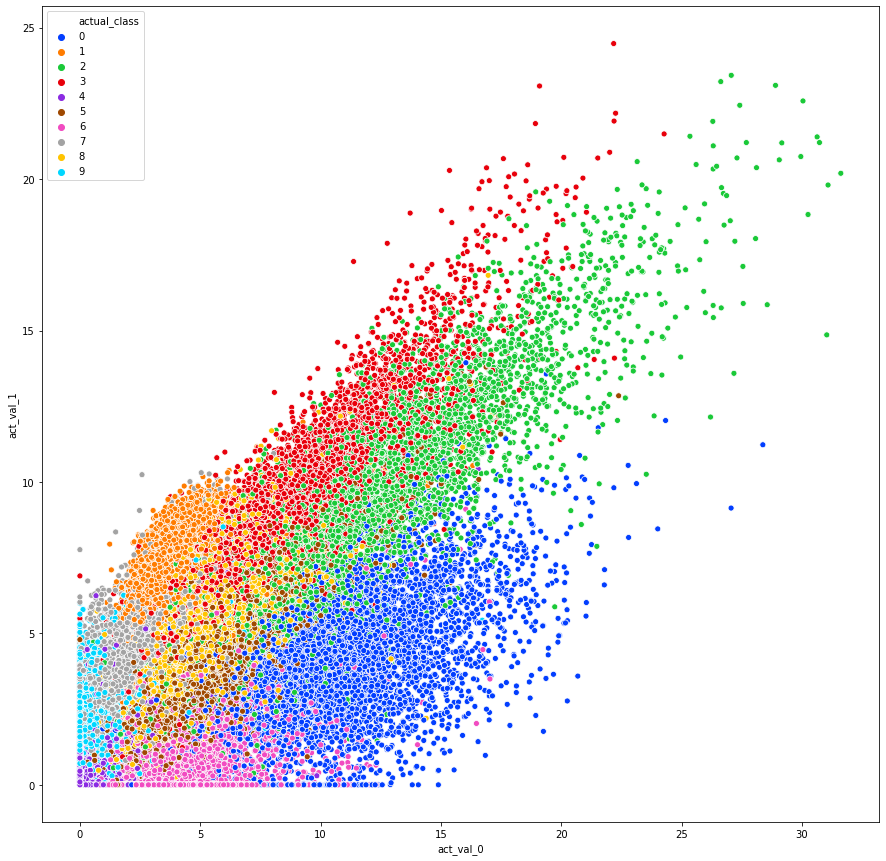

In [22]:
from matplotlib import pyplot
fig, ax = pyplot.subplots(figsize=(15, 15))
sns.scatterplot(x=activation_df['act_val_0'], y=activation_df['act_val_1'], hue = activation_df['actual_class'], palette=  'bright')

In [23]:
pred_classes2 = np.argmax(model2.predict(x_test), axis=-1)
pred_classes2

array([7, 2, 1, ..., 4, 5, 6], dtype=int64)

In [24]:
conf_mx = tf.math.confusion_matrix(y_test, pred_classes2)
conf_mx

<tf.Tensor: shape=(10, 10), dtype=int32, numpy=
array([[ 784,    0,   50,    1,    1,   63,   74,    1,    6,    0],
       [   0, 1029,    3,   26,    0,    4,    0,   63,    9,    1],
       [  60,    7,  565,  207,    8,   45,   16,   19,   99,    6],
       [   3,   46,  111,  660,    1,    7,    1,   44,  134,    3],
       [   1,    1,    1,    0,  834,    6,   21,    9,    3,  106],
       [  44,    1,   99,   34,   17,  389,   63,   40,  199,    6],
       [  46,    0,    1,    1,   51,   48,  797,    5,    7,    2],
       [   0,   78,    3,   12,   31,   14,    3,  634,   43,  210],
       [  15,   24,   59,  102,   18,  214,   15,  108,  406,   13],
       [   5,   11,    2,    6,  107,    8,    8,   48,   13,  801]])>

In [25]:
print(f'accuracy score for 2 node hidden layer is: {accuracy_score(y_test, pred_classes2)*100}%')

accuracy score for 2 node hidden layer is: 68.99%


EXPERIMENT 3

In [5]:
def experimentModel(nodes):
    model = Sequential([
    Dense(input_shape=[784], units = nodes, activation = tf.nn.relu),
    Dense(name = "output_layer", units = 10, activation = tf.nn.softmax)])

    model.compile(optimizer='rmsprop',           
               loss = 'categorical_crossentropy',
               metrics=['accuracy'])
    history = model.fit(
    x_train
    ,y_train_encoded
    ,epochs = 200
    ,validation_split=0.08333
    ,callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10)] 
    )

    return model

In [11]:
def accuracyAndMatrix(model):
    pred_classes = np.argmax(model.predict(x_test), axis=-1)
    conf_mx = tf.math.confusion_matrix(y_test, pred_classes)
    print(conf_mx)
    print(f'accuracy score for model is: {accuracy_score(y_test, pred_classes)*100}%')


In [9]:
modelAdam= Sequential([
    Dense(input_shape=[784], units = 128, activation = tf.nn.relu),
    Dense(name = "output_layer", units = 10, activation = tf.nn.softmax)
])
modelAdam.compile(optimizer='adam',           
               loss = 'categorical_crossentropy',
               metrics=['accuracy'])
history = modelAdam.fit(
    x_train
    ,y_train_encoded
    ,epochs = 200
    ,validation_split=0.08333
    ,callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10)] 
    )

Epoch 1/200
1719/1719 [==============================] - 3s 1ms/step - loss: 0.4489 - accuracy: 0.8748 - val_loss: 0.1241 - val_accuracy: 0.9678
Epoch 2/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.1333 - accuracy: 0.9615 - val_loss: 0.0919 - val_accuracy: 0.9726
Epoch 3/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0843 - accuracy: 0.9752 - val_loss: 0.0823 - val_accuracy: 0.9778
Epoch 4/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0616 - accuracy: 0.9816 - val_loss: 0.0727 - val_accuracy: 0.9776
Epoch 5/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0480 - accuracy: 0.9852 - val_loss: 0.0825 - val_accuracy: 0.9766
Epoch 6/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0353 - accuracy: 0.9892 - val_loss: 0.0800 - val_accuracy: 0.9762
Epoch 7/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0289 - accuracy: 0.9912 - val_loss: 0.0673 - val_ac

In [14]:
accuracyAndMatrix(modelAdam)

tf.Tensor(
[[ 972    1    1    1    1    1    2    1    0    0]
 [   0 1128    1    1    0    1    2    1    1    0]
 [   4    1 1004    4    2    0    4    7    4    2]
 [   0    0    3  985    0   13    1    4    0    4]
 [   1    0    1    0  948    0    5    3    0   24]
 [   3    0    0    5    0  869   10    1    3    1]
 [   3    2    0    1    3    6  943    0    0    0]
 [   2    1    7    6    1    0    0  997    1   13]
 [   5    1    2   16    5    6    3    3  923   10]
 [   0    2    0    2    4    2    1    4    1  993]], shape=(10, 10), dtype=int32)
accuracy score for model is: 97.61999999999999%


In [15]:
modelAda= Sequential([
    Dense(input_shape=[784], units = 128, activation = tf.nn.relu),
    Dense(name = "output_layer", units = 10, activation = tf.nn.softmax)
])
modelAda.compile(optimizer='adagrad',           
               loss = 'categorical_crossentropy',
               metrics=['accuracy'])
history = modelAda.fit(
    x_train
    ,y_train_encoded
    ,epochs = 200
    ,validation_split=0.08333
    ,callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10)] 
    )

ms/step - loss: 0.2898 - accuracy: 0.9204 - val_loss: 0.2278 - val_accuracy: 0.9396
Epoch 24/200
1719/1719 [==============================] - 3s 2ms/step - loss: 0.2856 - accuracy: 0.9209 - val_loss: 0.2254 - val_accuracy: 0.9396
Epoch 25/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.2859 - accuracy: 0.9203 - val_loss: 0.2232 - val_accuracy: 0.9408
Epoch 26/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.2852 - accuracy: 0.9218 - val_loss: 0.2214 - val_accuracy: 0.9404
Epoch 27/200
1719/1719 [==============================] - 3s 2ms/step - loss: 0.2730 - accuracy: 0.9254 - val_loss: 0.2193 - val_accuracy: 0.9416
Epoch 28/200
1719/1719 [==============================] - 3s 1ms/step - loss: 0.2721 - accuracy: 0.9252 - val_loss: 0.2175 - val_accuracy: 0.9414
Epoch 29/200
1719/1719 [==============================] - 3s 2ms/step - loss: 0.2739 - accuracy: 0.9242 - val_loss: 0.2159 - val_accuracy: 0.9414
Epoch 30/200
1719/1719 [================

In [16]:
accuracyAndMatrix(modelAda)

tf.Tensor(
[[ 965    0    1    1    0    4    6    2    1    0]
 [   0 1117    2    2    0    1    3    2    8    0]
 [   7    1  969   10    7    1    7    8   19    3]
 [   1    1   15  951    0   13    1    9   11    8]
 [   1    1    3    1  935    0   11    4    4   22]
 [   6    2    0   23    4  829   10    3    9    6]
 [   8    3    2    1    7   11  924    0    2    0]
 [   2   10   17    7    5    1    0  971    1   14]
 [   5    4    4   15    8    8   10    7  907    6]
 [   9    6    1   14   20    4    1    9    4  941]], shape=(10, 10), dtype=int32)
accuracy score for model is: 95.09%


In [32]:
exp128 = experimentModel(128)

Epoch 1/200
1719/1719 [==============================] - 3s 2ms/step - loss: 0.4356 - accuracy: 0.8788 - val_loss: 0.1304 - val_accuracy: 0.9618
Epoch 2/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.1341 - accuracy: 0.9604 - val_loss: 0.1046 - val_accuracy: 0.9724
Epoch 3/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0978 - accuracy: 0.9717 - val_loss: 0.0973 - val_accuracy: 0.9732
Epoch 4/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0729 - accuracy: 0.9790 - val_loss: 0.0888 - val_accuracy: 0.9752
Epoch 5/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0598 - accuracy: 0.9826 - val_loss: 0.0960 - val_accuracy: 0.9748
Epoch 6/200
1719/1719 [==============================] - 3s 1ms/step - loss: 0.0506 - accuracy: 0.9851 - val_loss: 0.0947 - val_accuracy: 0.9762
Epoch 7/200
1719/1719 [==============================] - 3s 1ms/step - loss: 0.0418 - accuracy: 0.9876 - val_loss: 0.0962 - val_ac

In [33]:
accuracyAndMatrix(exp128)

tf.Tensor(
[[ 971    0    0    2    1    1    1    1    3    0]
 [   0 1123    2    3    0    1    2    2    2    0]
 [   3    0 1005    5    1    0    4    6    8    0]
 [   0    0    3  991    0    3    0    5    3    5]
 [   1    0    4    1  953    0    6    4    3   10]
 [   2    0    0   16    0  860    6    0    6    2]
 [   5    3    3    1    5    3  936    0    2    0]
 [   1    2   10    5    1    0    0  997    5    7]
 [   1    1    3    6    4    1    2    5  949    2]
 [   2    2    1    6    6    6    1    2    5  978]], shape=(10, 10), dtype=int32)
accuracy score for model is: 97.63%


In [23]:
modelExp = Sequential([
    Dense(input_shape=[784], units = 128, activation = tf.nn.relu),
    Dense(units = 128, activation = tf.nn.relu),
    Dense(units = 128, activation = tf.nn.relu),
    Dense(units = 128, activation = tf.nn.relu),
    Dense(units = 128, activation = tf.nn.relu),
    Dense(name = "output_layer", units = 10, activation = tf.nn.softmax)
])

In [24]:
modelExp.compile(optimizer=keras.optimizers.SGD(learning_rate=.0001, momentum = 0.9),           
               loss = 'categorical_crossentropy',
               metrics=['accuracy'])

In [25]:
history = modelExp.fit(
    x_train
    ,y_train_encoded
    ,epochs = 300
    ,validation_split=0.08333
    ,callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=100)] 
    )

 0.9774
Epoch 165/300
1719/1719 [==============================] - 4s 2ms/step - loss: 0.0108 - accuracy: 0.9985 - val_loss: 0.1036 - val_accuracy: 0.9748
Epoch 166/300
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0107 - accuracy: 0.9986 - val_loss: 0.1041 - val_accuracy: 0.9762
Epoch 167/300
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0111 - accuracy: 0.9985 - val_loss: 0.1046 - val_accuracy: 0.9764
Epoch 168/300
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0109 - accuracy: 0.9988 - val_loss: 0.1047 - val_accuracy: 0.9774
Epoch 169/300
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0101 - accuracy: 0.9987 - val_loss: 0.1045 - val_accuracy: 0.9758
Epoch 170/300
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0101 - accuracy: 0.9988 - val_loss: 0.1071 - val_accuracy: 0.9760
Epoch 171/300
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0096 - accuracy: 0.9990 - val

In [27]:
pred_classes = np.argmax(modelExp.predict(x_test), axis=-1)
conf_mx = tf.math.confusion_matrix(y_test, pred_classes)
print(conf_mx)
print(f'accuracy score for model is: {accuracy_score(y_test, pred_classes)*100}%')

tf.Tensor(
[[ 968    0    0    0    1    2    4    1    3    1]
 [   0 1122    3    1    0    1    2    1    5    0]
 [   5    6  992    7    3    0    6    7    6    0]
 [   2    0    6  987    1    2    0    3    4    5]
 [   2    1    3    0  957    0    2    4    0   13]
 [   3    1    1   13    2  860    6    1    3    2]
 [   2    2    3    1    5    9  931    1    4    0]
 [   1    5    8    7    2    0    0  992    3   10]
 [   4    0    4    6    2    3    4    3  943    5]
 [   3    3    0    5   12    3    1    5    2  975]], shape=(10, 10), dtype=int32)
accuracy score for model is: 97.27%


In [38]:
import pandas as pd 
kaggle = pd.read_csv('test.csv')

In [39]:
kaggle = kaggle.to_numpy()

In [40]:
kagglePred = modelExp.predict_classes(kaggle)

In [44]:
kaggleDF = pd.DataFrame(kagglePred, columns= ['Label'])
kaggleDF.index.name='ImageId'
kaggleDF.index+=1

In [45]:
kaggleDF.to_csv('kagglePred.csv')

In [52]:
kaggleTrain = pd.read_csv('train.csv')

In [47]:
kaggleTrainLabel = kaggleTrain.iloc[:,:1]
kaggleTrain = kaggleTrain.iloc[:,1:]

In [48]:
kaggleTrain = kaggleTrain.astype('float32') / 255
kaggleTrain = kaggleTrain.to_numpy()


In [49]:
kaggleTrainLabel = to_categorical(kaggleTrainLabel)

In [50]:
history = modelExp.fit(
    kaggleTrain
    ,kaggleTrainLabel
    ,epochs = 300
    ,validation_split=0.08333
    ,callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=30)] 
    )

Epoch 1/300
1204/1204 [==============================] - 2s 2ms/step - loss: 0.0384 - accuracy: 0.9905 - val_loss: 0.0326 - val_accuracy: 0.9931
Epoch 2/300
1204/1204 [==============================] - 2s 2ms/step - loss: 0.0355 - accuracy: 0.9910 - val_loss: 0.0316 - val_accuracy: 0.9931
Epoch 3/300
1204/1204 [==============================] - 2s 2ms/step - loss: 0.0334 - accuracy: 0.9916 - val_loss: 0.0349 - val_accuracy: 0.9920
Epoch 4/300
1204/1204 [==============================] - 2s 2ms/step - loss: 0.0319 - accuracy: 0.9922 - val_loss: 0.0341 - val_accuracy: 0.9914
Epoch 5/300
1204/1204 [==============================] - 2s 2ms/step - loss: 0.0304 - accuracy: 0.9925 - val_loss: 0.0345 - val_accuracy: 0.9931
Epoch 6/300
1204/1204 [==============================] - 2s 2ms/step - loss: 0.0292 - accuracy: 0.9932 - val_loss: 0.0367 - val_accuracy: 0.9909
Epoch 7/300
1204/1204 [==============================] - 2s 2ms/step - loss: 0.0283 - accuracy: 0.9928 - val_loss: 0.0334 - val_ac

In [53]:
pred_classes = np.argmax(modelExp.predict(kaggleTrain.iloc[:,1:]), axis=-1)
conf_mx = tf.math.confusion_matrix(kaggleTrain.iloc[:,:1], pred_classes)
print(conf_mx)
print(f'accuracy score for model is: {accuracy_score(kaggleTrain.iloc[:,:1], pred_classes)*100}%')

tf.Tensor(
[[4126    0    0    2    0    0    1    2    1    0]
 [   0 4674    0    3    0    0    1    4    2    0]
 [   0    1 4147   12    0    0    0   17    0    0]
 [   0    0    0 4351    0    0    0    0    0    0]
 [   0    3    1    0 4060    0    1    3    1    3]
 [   2    1    1   83    0 3700    4    0    3    1]
 [   4    2    1    1    3    0 4126    0    0    0]
 [   0    5    2    2    0    0    0 4391    0    1]
 [   7   18    4  101    2    2    5    4 3912    8]
 [   4    3    0   31   10    0    0   28    1 4111]], shape=(10, 10), dtype=int32)
accuracy score for model is: 99.04285714285714%


EXPERIMENT 4

In [33]:
pca = PCA(n_components= 154)
principalComponents = pca.fit_transform(x_train)

In [34]:
principalComponents

array([[ 0.4859489 , -1.2261746 , -0.09614332, ...,  0.02659433,
         0.10604267, -0.43107116],
       [ 3.967481  , -1.1562622 ,  2.3386486 , ...,  0.23689358,
        -0.05158368,  0.09101261],
       [-0.20337684,  1.5379426 , -0.73925954, ...,  0.17787115,
        -0.1880838 ,  0.18352984],
       ...,
       [-0.698295  ,  0.6277581 , -1.0102686 , ..., -0.12483253,
         0.04385874,  0.07266439],
       [ 0.5121366 , -0.02193564,  2.015113  , ...,  0.21276937,
        -0.15789565,  0.1482938 ],
       [-0.6801855 , -0.09694139,  2.1804454 , ..., -0.07116656,
        -0.23193012, -0.00586023]], dtype=float32)

In [31]:
modelReduced = Sequential([
    Dense(input_shape=[154], units = 128, activation = tf.nn.relu),
    Dense(name = "output_layer", units = 10, activation = tf.nn.softmax)])

modelReduced.compile(optimizer='rmsprop',           
               loss = 'categorical_crossentropy',
               metrics=['accuracy'])

history = modelReduced.fit(
    principalComponents
    ,y_train_encoded
    ,epochs = 200
    ,validation_split=0.08333
    ,callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=25)]
    )

Epoch 1/200
1719/1719 [==============================] - 3s 1ms/step - loss: 0.5805 - accuracy: 0.8423 - val_loss: 0.1190 - val_accuracy: 0.9662
Epoch 2/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.1235 - accuracy: 0.9649 - val_loss: 0.0922 - val_accuracy: 0.9732
Epoch 3/200
1719/1719 [==============================] - 2s 989us/step - loss: 0.0819 - accuracy: 0.9769 - val_loss: 0.0830 - val_accuracy: 0.9774
Epoch 4/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0615 - accuracy: 0.9828 - val_loss: 0.0794 - val_accuracy: 0.9782
Epoch 5/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0460 - accuracy: 0.9873 - val_loss: 0.0811 - val_accuracy: 0.9788
Epoch 6/200
1719/1719 [==============================] - 2s 942us/step - loss: 0.0332 - accuracy: 0.9915 - val_loss: 0.0831 - val_accuracy: 0.9800
Epoch 7/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0254 - accuracy: 0.9936 - val_loss: 0.0815 - va

In [35]:
pred_classes = np.argmax(modelReduced.predict(principalComponents), axis=-1)
conf_mx = tf.math.confusion_matrix(y_train, pred_classes)
print(conf_mx)
print(f'accuracy score for model is: {accuracy_score(y_train, pred_classes)*100}%')

tf.Tensor(
[[5905    0    4    0    1    1    6    1    2    3]
 [   0 6729    5    2    1    0    0    2    3    0]
 [   4    2 5919    7    8    2    3    6    6    1]
 [   1    0    9 6104    2    6    0    1    7    1]
 [   0    3    1    1 5813    0    4    4    2   14]
 [   4    0    1    6    1 5387   10    1    6    5]
 [   5    2    2    0    2    6 5897    0    4    0]
 [   1    5    4    2    6    0    0 6240    1    6]
 [   0   14    3    5    2    8    1    5 5806    7]
 [   3    0    1    7    5    5    0    6    3 5919]], shape=(10, 10), dtype=int32)
accuracy score for model is: 99.53166666666667%


In [36]:
x_test_reduced = pca.transform(x_test)
pred_classes = np.argmax(modelReduced.predict(x_test_reduced), axis=-1)
conf_mx = tf.math.confusion_matrix(y_test, pred_classes)
print(conf_mx)
print(f'accuracy score for model is: {accuracy_score(y_test, pred_classes)*100}%')

tf.Tensor(
[[ 967    0    0    1    2    3    1    1    1    4]
 [   0 1124    2    2    0    2    2    1    2    0]
 [   8    4  995    6    2    1    3    3    9    1]
 [   0    0    4  984    1    9    0    4    2    6]
 [   0    0    5    1  959    0    4    1    1   11]
 [   3    1    0    7    0  872    5    1    2    1]
 [   3    3    0    1    7    7  936    1    0    0]
 [   1    5    8    4    1    0    0 1001    2    6]
 [   5    4    0    4    4    4    4    6  938    5]
 [   1    2    0    4   10    5    1    6    2  978]], shape=(10, 10), dtype=int32)
accuracy score for model is: 97.54%


EXPERIMENT 5

In [94]:
rand_clf  = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
rand_clf.fit(x_train,y_train_encoded)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [95]:
imp_feats_arr = rand_clf.feature_importances_
idx = (-imp_feats_arr).argsort()[:70]

In [109]:
x_train_top70 = x_train[:,idx]
x_test_top70 = x_test[:,idx]

In [114]:
modelTop70 = Sequential([
    Dense(input_shape=[70], units = 128, activation = tf.nn.relu),
    Dense(name = "output_layer", units = 10, activation = tf.nn.softmax)])

modelTop70.compile(optimizer='rmsprop',           
               loss = 'categorical_crossentropy',
               metrics=['accuracy'])

history = modelTop70.fit(
    x_train_top70
    ,y_train_encoded
    ,epochs = 200
    ,validation_split=0.08333
    ,callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=25)]
    )

Epoch 1/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.8113 - accuracy: 0.7665 - val_loss: 0.3485 - val_accuracy: 0.8964
Epoch 2/200
1719/1719 [==============================] - 2s 935us/step - loss: 0.4050 - accuracy: 0.8770 - val_loss: 0.2797 - val_accuracy: 0.9188
Epoch 3/200
1719/1719 [==============================] - 2s 945us/step - loss: 0.3282 - accuracy: 0.8990 - val_loss: 0.2480 - val_accuracy: 0.9278
Epoch 4/200
1719/1719 [==============================] - 2s 935us/step - loss: 0.2889 - accuracy: 0.9126 - val_loss: 0.2240 - val_accuracy: 0.9332
Epoch 5/200
1719/1719 [==============================] - 2s 929us/step - loss: 0.2492 - accuracy: 0.9245 - val_loss: 0.2165 - val_accuracy: 0.9356
Epoch 6/200
1719/1719 [==============================] - 2s 928us/step - loss: 0.2463 - accuracy: 0.9254 - val_loss: 0.2051 - val_accuracy: 0.9384
Epoch 7/200
1719/1719 [==============================] - 2s 942us/step - loss: 0.2242 - accuracy: 0.9304 - val_loss: 0.2

In [121]:
pred_classes = np.argmax(modelTop70.predict(x_train_top70), axis=-1)
conf_mx = tf.math.confusion_matrix(y_train, pred_classes)
print(conf_mx)
print(f'accuracy score for model is: {accuracy_score(y_train, pred_classes)*100}%')

tf.Tensor(
[[5730    0   45   11    5   24   51    3   32   22]
 [   0 6638   40    7    2   10   10   10   22    3]
 [  13   23 5707   40   11   12   17   35   75   25]
 [  10    1   43 5859    5  133    3   16   40   21]
 [   2    9   14    8 5555   22   26   12   38  156]
 [  23    3   14   70    5 5207   19    3   49   28]
 [  13    7   13    3   28   45 5786    0   19    4]
 [   4   20  178   43   21   11    1 5880   19   88]
 [   1    8   16   25   11   17   12    1 5730   30]
 [   7    3   14   35   52   43    8   18   57 5712]], shape=(10, 10), dtype=int32)
accuracy score for model is: 96.34%


In [120]:
pred_classes = np.argmax(modelTop70.predict(x_test_top70), axis=-1)
conf_mx = tf.math.confusion_matrix(y_test, pred_classes)
print(conf_mx)
print(f'accuracy score for model is: {accuracy_score(y_test, pred_classes)*100}%')

tf.Tensor(
[[ 937    1   10    0    2    8   15    2    3    2]
 [   1 1109    5    5    4    1    3    1    6    0]
 [   0    7  939   17    8   12    8   11   23    7]
 [   1    1    7  936    2   45    0    3    9    6]
 [   1    3    7    1  912    3    6    1   15   33]
 [   5    1    4   22    3  832    6    1   11    7]
 [   6    5    4    1   20   12  896    0    9    5]
 [   2    1   54   12    3    0    0  930    7   19]
 [   3    0    6    6    7   13    3    1  920   15]
 [   3    3    9    6    9   17    1    5   18  938]], shape=(10, 10), dtype=int32)
accuracy score for model is: 93.49%


In [117]:
kaggle70 = kaggleTrain.iloc[:,idx]

In [119]:
pred_classes = np.argmax(modelTop70.predict(kaggle70), axis=-1)
conf_mx = tf.math.confusion_matrix(kaggleTrain.iloc[:,:1], pred_classes)
print(conf_mx)
print(f'accuracy score for model is: {accuracy_score(kaggleTrain.iloc[:,:1], pred_classes)*100}%')

tf.Tensor(
[[3415   13   74    6    0   73  534    0   15    2]
 [   0 4477   55   15    1    7    1  123    2    3]
 [  10   69 3782   15   12   66   61  126   26   10]
 [  20   27  100 3891    0  214    6   59   20   14]
 [   9   31   45   65 2745  347  565   45   18  202]
 [  30   77   24  154    2 3397   93    5    7    6]
 [  19  190   37    3    9   54 3804    2   17    2]
 [ 150   14  158   89    1   44    4 3894    1   46]
 [   6  195  115   46   17  205   99   38 3212  130]
 [  29   24   33  187   67  424  124   76   19 3205]], shape=(10, 10), dtype=int32)
accuracy score for model is: 85.2904761904762%


EXTRA EXPERIMENTS

In [12]:
exp256 = experimentModel(256)

Epoch 1/200
1719/1719 [==============================] - 5s 3ms/step - loss: 0.3873 - accuracy: 0.8881 - val_loss: 0.1092 - val_accuracy: 0.9692
Epoch 2/200
1719/1719 [==============================] - 4s 2ms/step - loss: 0.1134 - accuracy: 0.9663 - val_loss: 0.0837 - val_accuracy: 0.9780
Epoch 3/200
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0747 - accuracy: 0.9783 - val_loss: 0.0811 - val_accuracy: 0.9802
Epoch 4/200
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0563 - accuracy: 0.9839 - val_loss: 0.0847 - val_accuracy: 0.9798
Epoch 5/200
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0482 - accuracy: 0.9859 - val_loss: 0.0936 - val_accuracy: 0.9770
Epoch 6/200
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0378 - accuracy: 0.9898 - val_loss: 0.0870 - val_accuracy: 0.9790
Epoch 7/200
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0318 - accuracy: 0.9909 - val_loss: 0.0931 - val_ac

In [14]:
accuracyAndMatrix(exp256)

tf.Tensor(
[[ 971    0    0    1    1    0    5    1    1    0]
 [   0 1128    2    1    0    0    1    1    2    0]
 [   4    2 1002    5    3    0    3    9    4    0]
 [   0    0    7  991    0    5    0    3    2    2]
 [   0    0    1    0  960    0    8    4    1    8]
 [   2    0    1    6    1  871    5    1    3    2]
 [   6    3    1    1    3    3  941    0    0    0]
 [   1    4    6    3    0    0    0 1009    2    3]
 [   4    2    5    4    5    4    0    2  941    7]
 [   2    2    0    2    9    5    0    5    0  984]], shape=(10, 10), dtype=int32)
accuracy score for model is: 97.98%


In [15]:
exp512 = experimentModel(512)
accuracyAndMatrix(exp512)

Epoch 1/200
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3496 - accuracy: 0.8973 - val_loss: 0.1199 - val_accuracy: 0.9644
Epoch 2/200
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0952 - accuracy: 0.9716 - val_loss: 0.0784 - val_accuracy: 0.9794
Epoch 3/200
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0653 - accuracy: 0.9813 - val_loss: 0.0795 - val_accuracy: 0.9828
Epoch 4/200
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0488 - accuracy: 0.9856 - val_loss: 0.0809 - val_accuracy: 0.9834
Epoch 5/200
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0415 - accuracy: 0.9893 - val_loss: 0.0877 - val_accuracy: 0.9800
Epoch 6/200
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0294 - accuracy: 0.9913 - val_loss: 0.0965 - val_accuracy: 0.9794
Epoch 7/200
1719/1719 [==============================] - 7s 4ms/step - loss: 0.0234 - accuracy: 0.9933 - val_loss: 0.0910 - val_ac

In [17]:
 model128_2layer = Sequential([
 Dense(input_shape=[784], units = 128, activation = tf.nn.relu),
Dense(units=128, activation = tf.nn.relu),
Dense(name = "output_layer", units = 10, activation = tf.nn.softmax)])

model128_2layer.compile(optimizer='rmsprop',           
            loss = 'categorical_crossentropy',
            metrics=['accuracy'])
history = model128_2layer.fit(
x_train
,y_train_encoded
,epochs = 200
,validation_split=0.08333
,callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10)] 
)

Epoch 1/200
1719/1719 [==============================] - 5s 2ms/step - loss: 0.4033 - accuracy: 0.8806 - val_loss: 0.1030 - val_accuracy: 0.9680
Epoch 2/200
1719/1719 [==============================] - 4s 2ms/step - loss: 0.1082 - accuracy: 0.9676 - val_loss: 0.0912 - val_accuracy: 0.9758
Epoch 3/200
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0740 - accuracy: 0.9782 - val_loss: 0.1185 - val_accuracy: 0.9676
Epoch 4/200
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0582 - accuracy: 0.9825 - val_loss: 0.0902 - val_accuracy: 0.9766
Epoch 5/200
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0464 - accuracy: 0.9868 - val_loss: 0.0905 - val_accuracy: 0.9800
Epoch 6/200
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0427 - accuracy: 0.9872 - val_loss: 0.1097 - val_accuracy: 0.9784
Epoch 7/200
1719/1719 [==============================] - 3s 2ms/step - loss: 0.0350 - accuracy: 0.9906 - val_loss: 0.1026 - val_ac

In [18]:
accuracyAndMatrix(model128_2layer)

tf.Tensor(
[[ 966    1    2    0    3    1    5    1    0    1]
 [   0 1118    4    2    0    1    2    1    6    1]
 [   2    2 1013    2    1    0    0    8    4    0]
 [   0    0    6  995    0    2    0    3    2    2]
 [   1    0    4    2  955    0    6    3    1   10]
 [   2    0    0    9    0  870    6    1    2    2]
 [   4    1    0    1    2    7  942    0    0    1]
 [   2    0    9    2    0    0    0 1009    4    2]
 [   1    1    4    9    3    6    2    1  943    4]
 [   1    2    1    6    6    5    0    6    5  977]], shape=(10, 10), dtype=int32)
accuracy score for model is: 97.88%


In [17]:
model128_3layer = Sequential([
 Dense(input_shape=[784], units = 128, activation = tf.nn.relu),
Dense(units=128, activation = tf.nn.relu),
Dense(units=128, activation = tf.nn.relu),
Dense(name = "output_layer", units = 10, activation = tf.nn.softmax)])

model128_3layer.compile(optimizer='adam',           
            loss = 'categorical_crossentropy',
            metrics=['accuracy'])
history = model128_3layer.fit(
x_train
,y_train_encoded
,epochs = 200
,validation_split=0.08333
,callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10)] 
)

Epoch 1/200
1719/1719 [==============================] - 3s 1ms/step - loss: 0.4234 - accuracy: 0.8740 - val_loss: 0.0965 - val_accuracy: 0.9696
Epoch 2/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.1062 - accuracy: 0.9679 - val_loss: 0.0938 - val_accuracy: 0.9734
Epoch 3/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0758 - accuracy: 0.9763 - val_loss: 0.0999 - val_accuracy: 0.9708
Epoch 4/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0570 - accuracy: 0.9819 - val_loss: 0.0837 - val_accuracy: 0.9752
Epoch 5/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0457 - accuracy: 0.9851 - val_loss: 0.0883 - val_accuracy: 0.9774
Epoch 6/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0341 - accuracy: 0.9888 - val_loss: 0.1013 - val_accuracy: 0.9740
Epoch 7/200
1719/1719 [==============================] - 2s 1ms/step - loss: 0.0345 - accuracy: 0.9885 - val_loss: 0.0986 - val_ac

In [18]:
accuracyAndMatrix(model128_3layer)

tf.Tensor(
[[ 963    0    2    1    1    0    2    2    2    7]
 [   1 1124    1    1    0    1    1    2    4    0]
 [   1    0 1015    5    3    0    0    7    1    0]
 [   0    0    5  993    0    2    0    4    4    2]
 [   0    1    4    0  960    0    2    2    2   11]
 [   2    0    0   22    0  847    5    1   11    4]
 [   3    4    2    0    6    4  937    0    2    0]
 [   1    3   13    0    0    0    0 1002    3    6]
 [   3    0    4    4    1    1    1    3  954    3]
 [   2    2    0    7    4    2    0    5    6  981]], shape=(10, 10), dtype=int32)
accuracy score for model is: 97.76%


In [37]:
models = ['1 Node', '2 Nodes', '128 Nodes', '128 Nodes', '128 Nodes', '128 Nodes Reduced', '128 Nodes Top 70 feats', '128 Nodes', '128 Nodes', '128 Nodes','256 Nodes', '512 Nodes']
trainAccuracy = ['36.16%', '68.43', '99.96%','95.25%','99.90%', '100%','96.47%','99.76%', '99.44%', '99.78%', '98.42%','99.90%']
testAccuracy = ['37.42%','69%', '97.62%','95.09%','97.63%', '97.54%','96.34%','97.88%', '97.72%', '99.04%', '97.98%','98.17%']
validationAccuracy = ['36.30%', '71.52%','98.12%', '94.26%', '97.80%', '97.88%','94.14%','97.88%','97.92%', '98.80%','98.42','98.20%']
layers = [1,1,1,1,1,1,1,2,3,5,1,1]
optimizer = ['rmsprop','rmsprop','adam','adagrad','rmsprop','rmsprop','rmsprop','rmsprop','adam','sgd','rmsprop','rmsprop',]
summaryDF = pd.DataFrame({
    'Model' : models,
    'Layers' : layers,
    'Train Accuracy' : trainAccuracy,
    'Test Accuracy' : testAccuracy,
    'Validation Accuracy' : validationAccuracy,
    'Optimizer' : optimizer 
})
summaryDF.set_index('Model')

,Layers,Train Accuracy,Test Accuracy,Validation Accuracy,Optimizer
Model,,,,,
1 Node,1,36.16%,37.42%,36.30%,rmsprop
2 Nodes,1,68.43,69%,71.52%,rmsprop
128 Nodes,1,99.96%,97.62%,98.12%,adam
128 Nodes,1,95.25%,95.09%,94.26%,adagrad
128 Nodes,1,99.90%,97.63%,97.80%,rmsprop
128 Nodes Reduced,1,100%,97.54%,97.88%,rmsprop
128 Nodes Top 70 feats,1,96.47%,96.34%,94.14%,rmsprop
128 Nodes,2,99.76%,97.88%,97.88%,rmsprop
128 Nodes,3,99.44%,97.72%,97.92%,adam
